In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import lightgbm as lgbm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dense, Dropout, BatchNormalization, Activation 
from keras.callbacks import EarlyStopping, ModelCheckpoint

import gc
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
#print(os.listdir("../input"))
print(os.listdir("./input"))

# Any results you write to the current directory are saved as output.

['covertype_test.csv', 'covertype_test.csv.zip', 'covertype_train.csv', 'covertype_train.csv.zip', 'sample_submission.csv']


In [7]:
#train = pd.read_csv('../input/kaggletutorial/covertype_train.csv')
#test = pd.read_csv('../input/kaggletutorial/covertype_test.csv')

train = pd.read_csv('./input/covertype_train.csv')
test = pd.read_csv('./input/covertype_test.csv')

In [8]:
train.shape

(89077, 15)

In [9]:
test.shape

(85534, 14)

In [10]:
train.head()

,ID,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Soil_Type,Wilderness_Area,oil_Type,Cover_Type
0,1,7.655522e+24,85.0,16,618000,49,1443,241,211,96,2202,AM,A,AM,0
1,2,2.129340e+24,325.0,8,60000,11,2329,201,232,170,785,W,C,W,0
2,3,4.571753e+23,294.0,13,283000,75,2861,183,236,194,2125,AC,A,AC,1
3,4,2.778806e+23,115.0,13,134000,16,3131,242,227,113,1570,AC,A,AC,0
4,5,3.446127e+22,NaN,11,484000,-48,1293,238,224,116,1351,W,A,W,1


In [11]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89077 entries, 0 to 89076
Data columns (total 15 columns):
ID                                    89077 non-null int64
Elevation                             89077 non-null float64
Aspect                                80143 non-null float64
Slope                                 89077 non-null int64
Horizontal_Distance_To_Hydrology      89077 non-null int64
Vertical_Distance_To_Hydrology        89077 non-null int64
Horizontal_Distance_To_Roadways       89077 non-null int64
Hillshade_9am                         89077 non-null int64
Hillshade_Noon                        89077 non-null int64
Hillshade_3pm                         89077 non-null int64
Horizontal_Distance_To_Fire_Points    89077 non-null int64
Soil_Type                             89077 non-null object
Wilderness_Area                       89077 non-null object
oil_Type                              89077 non-null object
Cover_Type                            89077 non-null int64

In [12]:
train.describe()

,ID,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
count,89077.000000,8.907700e+04,80143.000000,89077.000000,8.907700e+04,89077.000000,89077.000000,89077.000000,89077.000000,89077.000000,89077.000000,89077.000000
mean,44539.000000,2.478885e+24,153.694496,13.410555,2.767523e+05,44.401922,3428.371241,213.140339,224.401147,143.111072,3723.892441,0.573717
std,25714.459301,5.969777e+24,111.463078,7.013046,2.141206e+05,57.225320,13814.672204,24.902182,18.467772,36.273091,20328.899661,0.494539
min,1.000000,1.342883e+20,0.000000,0.000000,0.000000e+00,-166.000000,0.000000,0.000000,30.000000,0.000000,0.000000,0.000000
25%,22270.000000,2.007433e+23,57.000000,8.000000,1.080000e+05,6.000000,1245.000000,200.000000,214.000000,120.000000,1146.000000,0.000000
50%,44539.000000,7.220106e+23,125.000000,12.000000,2.340000e+05,28.000000,2210.000000,218.000000,227.000000,143.000000,1852.000000,1.000000
75%,66808.000000,2.708217e+24,256.000000,17.000000,3.910000e+05,65.000000,3558.000000,231.000000,238.000000,168.000000,2676.000000,1.000000
max,89077.000000,2.198001e+26,360.000000,64.000000,1.376000e+06,599.000000,467680.000000,254.000000,254.000000,254.000000,613795.000000,1.000000


In [16]:
### Column Type Check

In [14]:
dtype_df = train.dtypes.reset_index()
dtype_df.columns = ['column','dtype']
dtype_df.groupby(['dtype']).agg('count').reset_index()

,dtype,column
0,int64,10
1,float64,2
2,object,3


In [17]:
### Null Check

In [18]:
train.isnull().sum()

ID                                       0
Elevation                                0
Aspect                                8934
Slope                                    0
Horizontal_Distance_To_Hydrology         0
Vertical_Distance_To_Hydrology           0
Horizontal_Distance_To_Roadways          0
Hillshade_9am                            0
Hillshade_Noon                           0
Hillshade_3pm                            0
Horizontal_Distance_To_Fire_Points       0
Soil_Type                                0
Wilderness_Area                          0
oil_Type                                 0
Cover_Type                               0
dtype: int64

In [19]:
missing_df = train.isnull().sum().reset_index()
missing_df.columns = ['column', 'count']
missing_df['ratio'] = missing_df['count'] / train.shape[0]
missing_df.loc[missing_df['ratio'] != 0]

,column,count,ratio
2,Aspect,8934,0.100295


In [20]:
### Target Value Check

In [21]:
set(train.columns) - set(test.columns)

{'Cover_Type'}

In [22]:
train['Cover_Type'].value_counts() / train.shape[0] * 100

1    57.371712
0    42.628288
Name: Cover_Type, dtype: float64

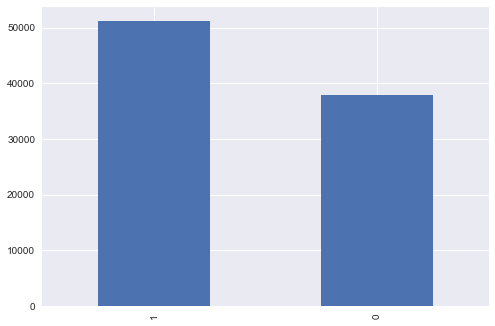

In [23]:
train['Cover_Type'].value_counts().plot(kind='bar')
plt.show()

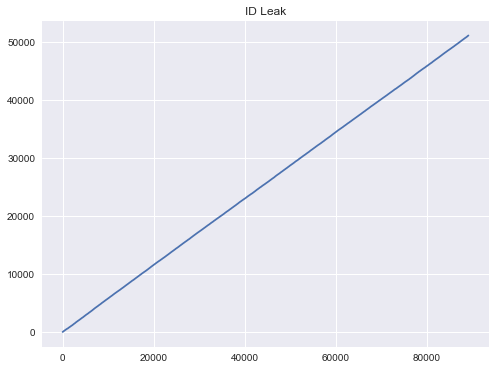

In [24]:
plt.figure(figsize=(8,6))
plt.plot(train['Cover_Type'].cumsum())
plt.title('ID Leak')
plt.show()

In [25]:
### Category Feature

In [26]:
category_feature = [ col for col in train.columns if train[col].dtypes == "object"]
category_feature

['Soil_Type', 'Wilderness_Area', 'oil_Type']

In [27]:
train[category_feature].head()

,Soil_Type,Wilderness_Area,oil_Type
0,AM,A,AM
1,W,C,W
2,AC,A,AC
3,AC,A,AC
4,W,A,W


In [28]:
train[category_feature].nunique()

Soil_Type          35
Wilderness_Area     4
oil_Type           35
dtype: int64

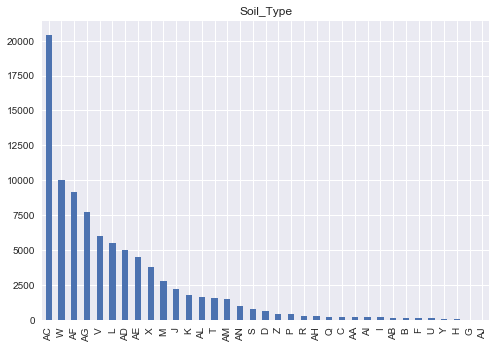

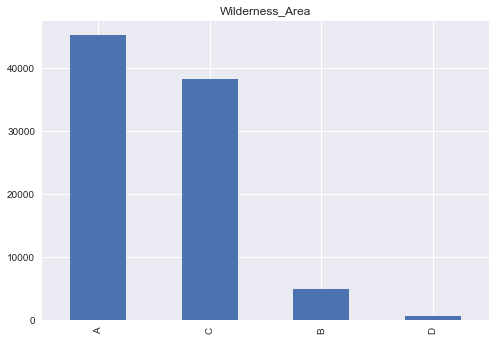

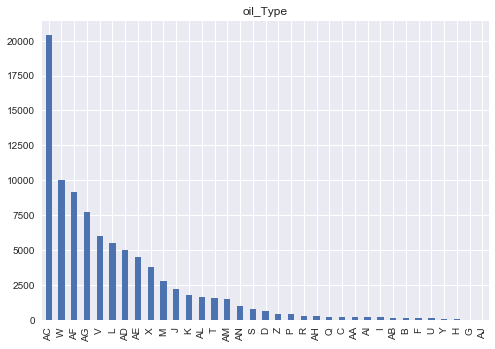

In [29]:
for col in category_feature:
    train[col].value_counts().plot(kind='bar')
    plt.title(col)
    plt.show()

In [30]:
soiltype_df = train.groupby(['Soil_Type','Cover_Type'])['Soil_Type'].count().unstack('Cover_Type')
soiltype_df

Cover_Type,0,1
Soil_Type,,
AA,120.0,88.0
AB,5.0,158.0
AC,7502.0,12897.0
AD,1367.0,3624.0
AE,2132.0,2340.0
AF,3822.0,5350.0
AG,3240.0,4504.0
AH,20.0,272.0
AI,197.0,1.0


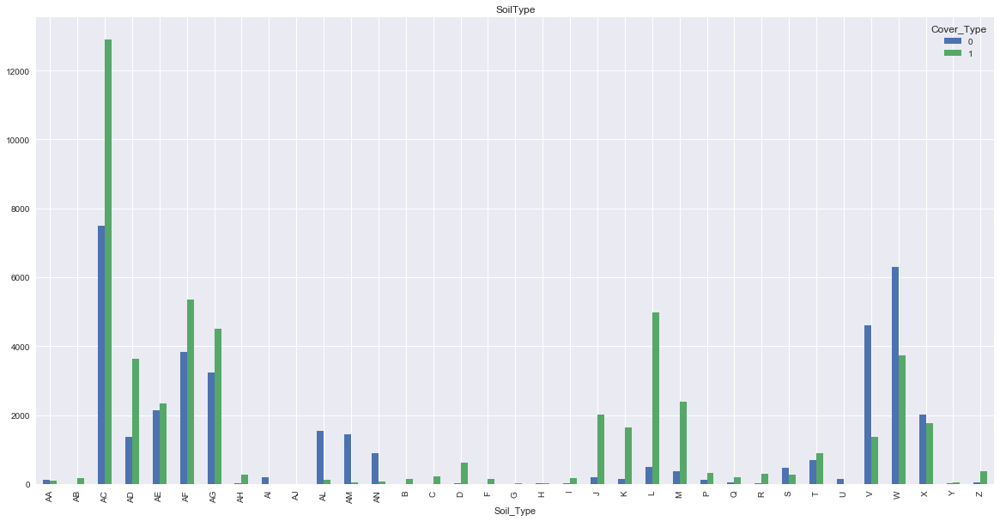

In [31]:
soiltype_df.plot(kind='bar', figsize=(20,10))
plt.title('SoilType')
plt.show()

In [32]:
wildeness_df = train.groupby(['Wilderness_Area','Cover_Type'])['Wilderness_Area'].count().unstack('Cover_Type')
wildeness_df

Cover_Type,0,1
Wilderness_Area,,
A,18953.0,26352.0
B,3263.0,1617.0
C,15756.0,22591.0
D,NaN,545.0


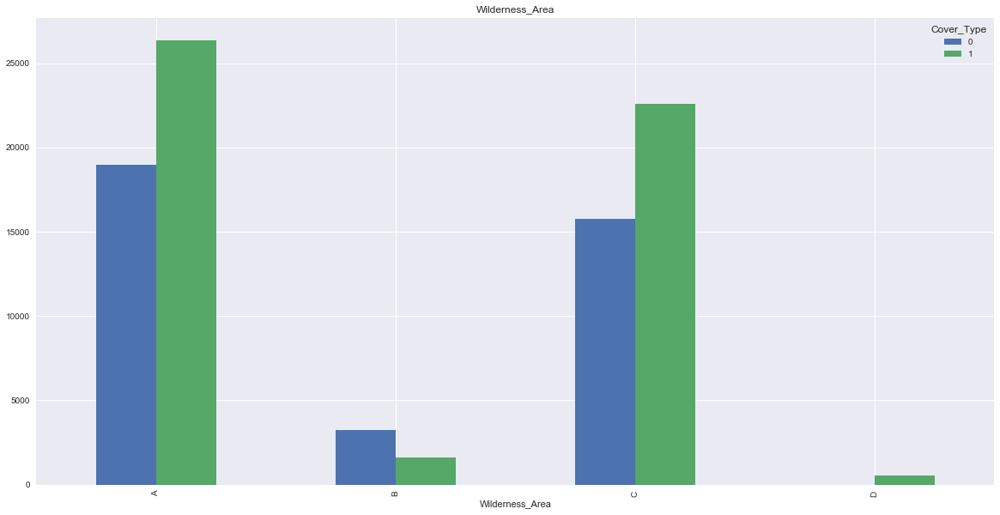

In [33]:
wildeness_df.plot(kind='bar', figsize=(20,10))
plt.title('Wilderness_Area')
plt.show()

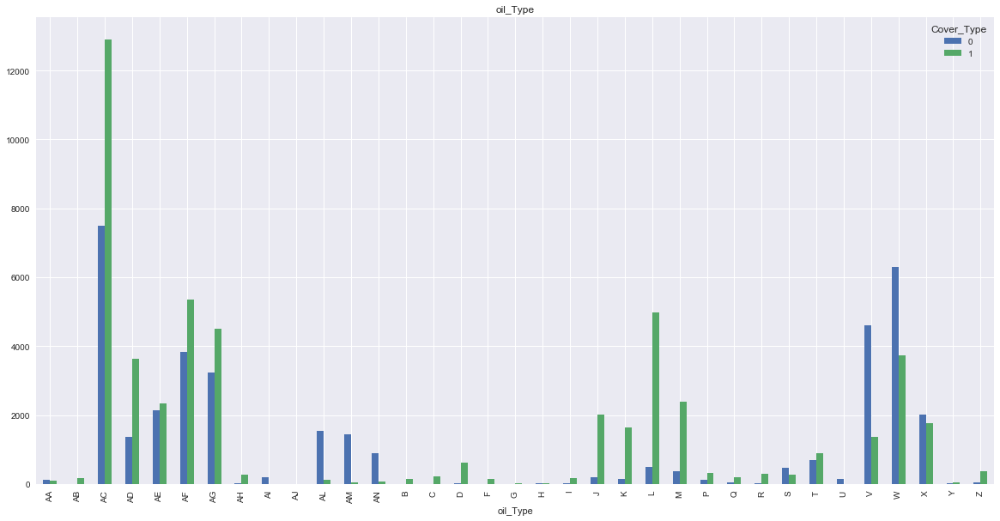

In [34]:
oiltype_df = train.groupby(['oil_Type','Cover_Type'])['oil_Type'].count().unstack('Cover_Type')
oiltype_df.plot(kind='bar', figsize=(20,10))
plt.title('oil_Type')
plt.show()

In [35]:
### Column Duplicate Check

In [36]:
all_data_cat = pd.concat([train[category_feature], test[category_feature]])

In [37]:
np.sum(np.abs(all_data_cat['Soil_Type'].factorize()[0] - all_data_cat['oil_Type'].factorize()[0]))

0

In [38]:
all_data_cat['Soil_Type']

0        AM
1         W
2        AC
3        AC
4         W
5        AC
6         W
7        AF
8        AE
9        AC
10        W
11       AC
12        V
13        K
14       AD
15       AF
16       AC
17       AE
18       AG
19       AA
20       AM
21        L
22       AC
23       AC
24       AC
25       AL
26       AG
27       AF
28        L
29       AG
         ..
85504    AG
85505    AD
85506     V
85507     L
85508    AE
85509    AC
85510    AM
85511     C
85512     D
85513    AG
85514     Z
85515    AC
85516    AG
85517    AC
85518    AC
85519    AH
85520    AC
85521    AE
85522     L
85523    AG
85524    AG
85525    AC
85526    AC
85527     K
85528    AF
85529    AF
85530    AC
85531     M
85532    AC
85533    AD
Name: Soil_Type, Length: 174611, dtype: object

In [39]:
all_data_cat['Soil_Type'].factorize()[0]

array([ 0,  1,  2, ..., 13,  2,  7], dtype=int64)

In [40]:
all_data_cat['is_same'] = all_data_cat.apply(lambda row: 1 if row['Soil_Type']== row['oil_Type'] else 0 ,axis=1)
all_data_cat.loc[all_data_cat['is_same']==0]

,Soil_Type,Wilderness_Area,oil_Type,is_same


In [41]:
%timeit(all_data_cat.apply(lambda row: 1 if row['Soil_Type']== row['oil_Type'] else 0 ,axis=1))

3.93 s ± 182 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [42]:
### Numerical Feature

In [43]:
numerical_feature = list(set(train.columns) - set(category_feature) - set(['ID','Cover_Type']))
numerical_feature = np.sort(numerical_feature)
numerical_feature

array(['Aspect', 'Elevation', 'Hillshade_3pm', 'Hillshade_9am',
       'Hillshade_Noon', 'Horizontal_Distance_To_Fire_Points',
       'Horizontal_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Slope',
       'Vertical_Distance_To_Hydrology'], 
      dtype='<U34')

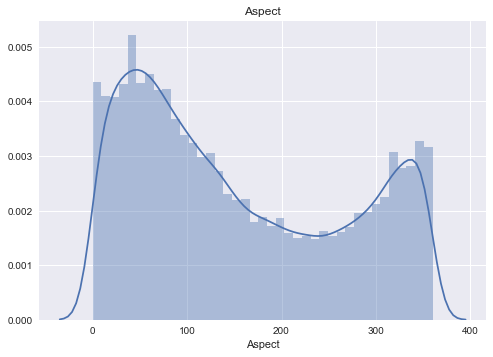

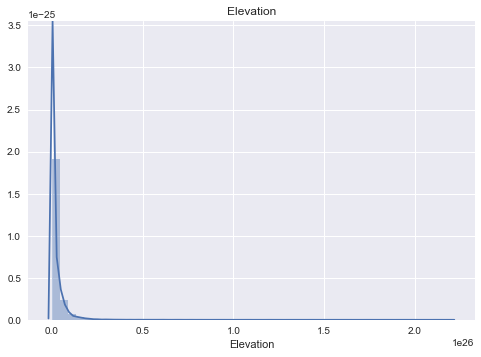

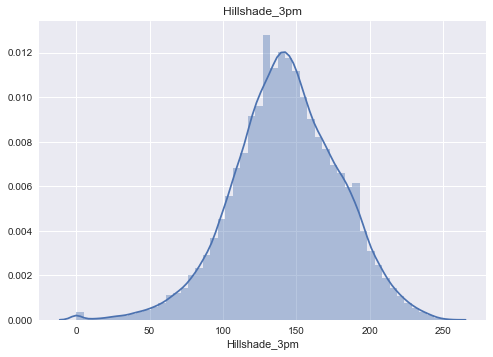

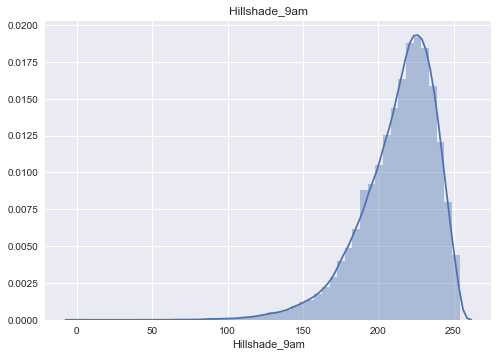

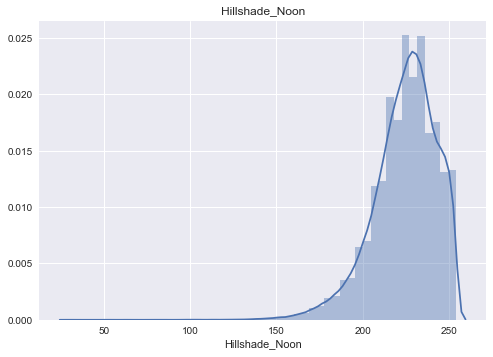

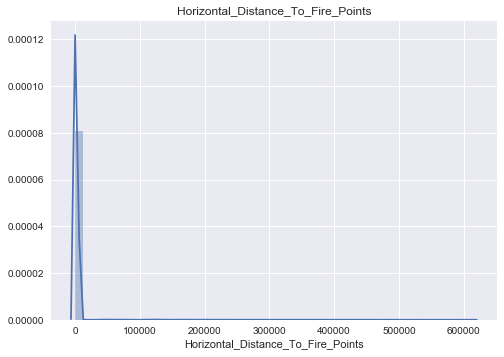

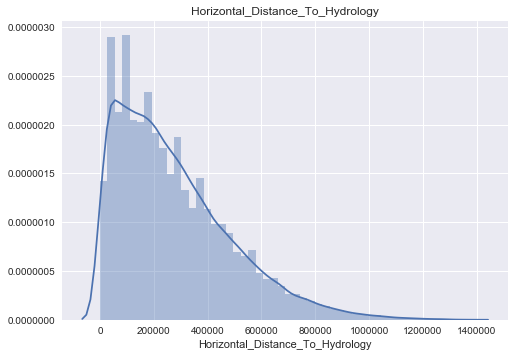

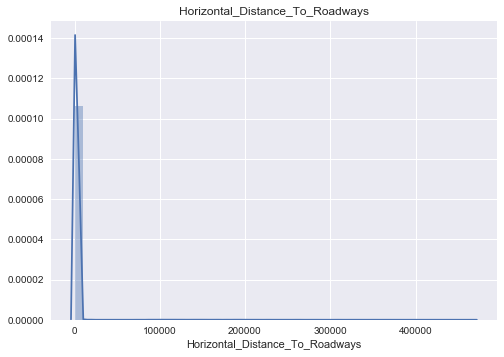

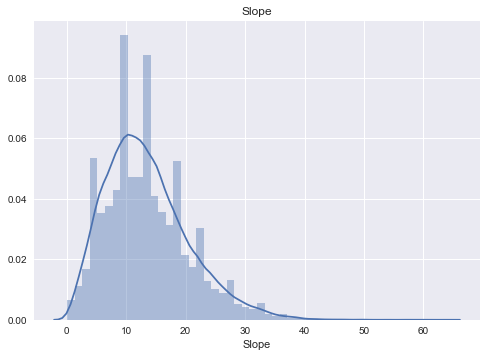

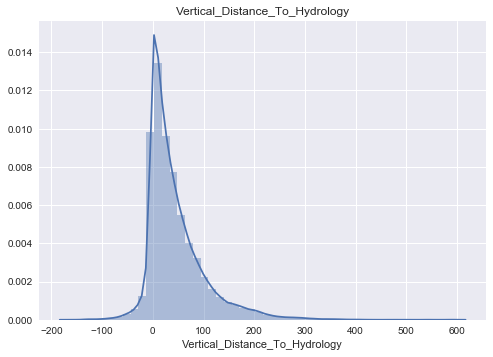

In [44]:
for col in numerical_feature:
    sns.distplot(train.loc[train[col].notnull(), col])
    plt.title(col)
    plt.show()

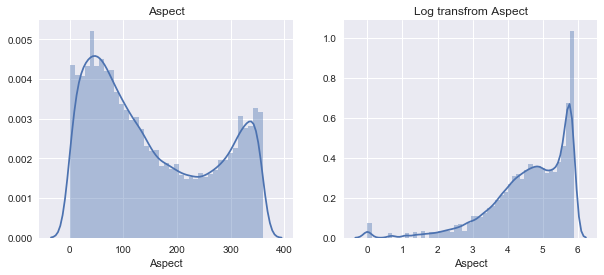

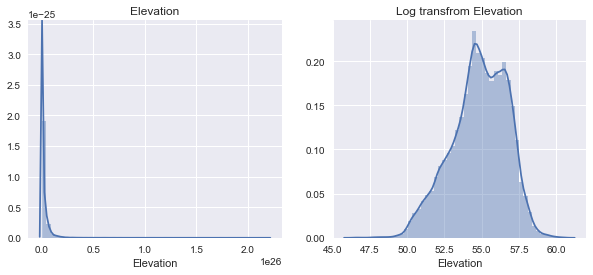

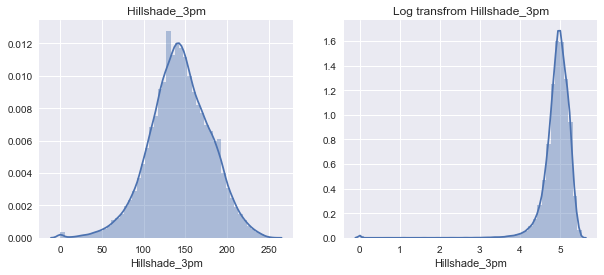

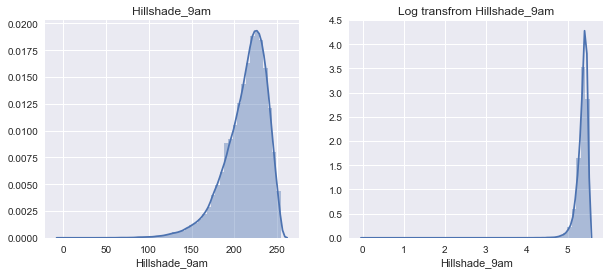

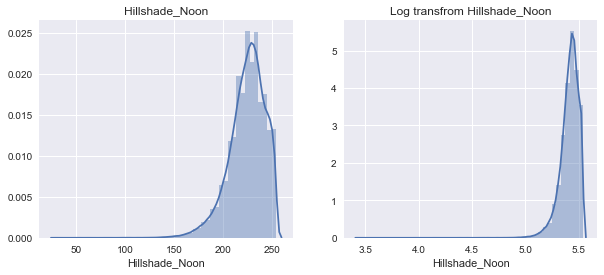

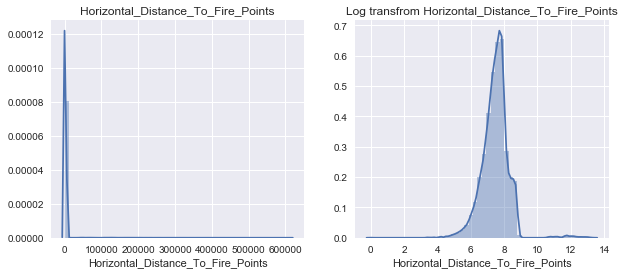

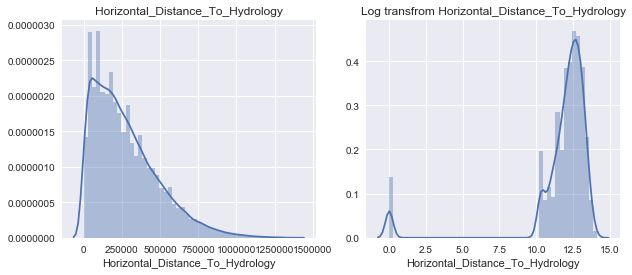

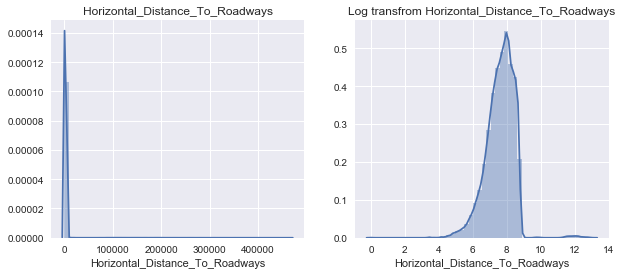

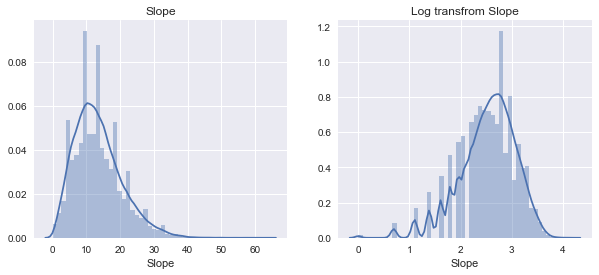

C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log1p
  import sys
C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log1p
  import sys


ValueError: cannot convert float NaN to integer

In [45]:
for col in numerical_feature:
    col_value = train.loc[train[col].notnull(), col]
    
    fig, axs = plt.subplots(ncols=2,figsize=(10,4))
    sns.distplot(col_value, ax=axs[0])
    axs[0].set_title(col)
    sns.distplot(np.log1p(col_value), ax=axs[1])
    axs[1].set_title('Log transfrom {}'.format(col))
    plt.show()

In [46]:
train.loc[train['Vertical_Distance_To_Hydrology']<0].head()

,ID,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Soil_Type,Wilderness_Area,oil_Type,Cover_Type
4,5,3.446127e+22,NaN,11,484000,-48,1293,238,224,116,1351,W,A,W,1
15,16,1.188395e+24,247.0,7,553000,-47,2252,205,246,179,1550,AF,C,AF,1
28,29,3.651101e+22,308.0,3,540000,-13,940,212,237,164,1528,L,A,L,1
38,39,8.580788e+23,207.0,11,382000,-32,5825,213,250,171,2808,AC,A,AC,0
43,44,1.461800e+24,180.0,8,210000,-22,1883,223,245,155,2036,M,C,M,1


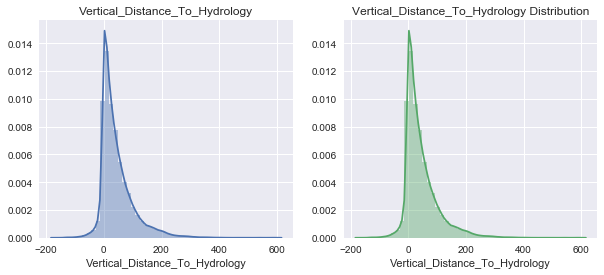

In [47]:
sns.distplot(train['Vertical_Distance_To_Hydrology'])
plt.title('Vertical_Distance_To_Hydrology Distribution')
plt.show()

In [48]:
### Numerical Feature vs Numerical Feature

In [49]:
distance_feature = [col for col in train.columns if col.find('Distance') != -1 ]
distance_feature

['Horizontal_Distance_To_Hydrology',
 'Vertical_Distance_To_Hydrology',
 'Horizontal_Distance_To_Roadways',
 'Horizontal_Distance_To_Fire_Points']

In [50]:
sns.pairplot(train[distance_feature + ['Cover_Type']], hue='Cover_Type', 
             x_vars=distance_feature, y_vars=distance_feature, height=3)
plt.show()

TypeError: pairplot() got an unexpected keyword argument 'height'

In [51]:
other_numerical_feature = [col for col in numerical_feature if col.find('Distance') == -1]
other_numerical_df = train[other_numerical_feature + ['Cover_Type']]
other_numerical_df['Elevation'] = np.log1p(other_numerical_df['Elevation'])

sns.pairplot(other_numerical_df.dropna(), x_vars=other_numerical_feature, y_vars=other_numerical_feature, 
             hue='Cover_Type', height=3)
plt.show()

C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


TypeError: pairplot() got an unexpected keyword argument 'height'

In [52]:
other_numerical_feature = [col for col in numerical_feature if col.find('Distance') == -1]
distance_numerical_df = train.copy()
distance_numerical_df['Elevation'] = np.log1p(distance_numerical_df['Elevation'])

sns.pairplot(distance_numerical_df.dropna(), x_vars=other_numerical_feature, y_vars=distance_feature, 
             hue='Cover_Type', height=3)
plt.show()

del distance_numerical_df

TypeError: pairplot() got an unexpected keyword argument 'height'

In [53]:
### Category vs Numerical

In [54]:
for col in train.loc[:,train.dtypes=='object'].columns:
    train[col] = train[col].factorize()[0]

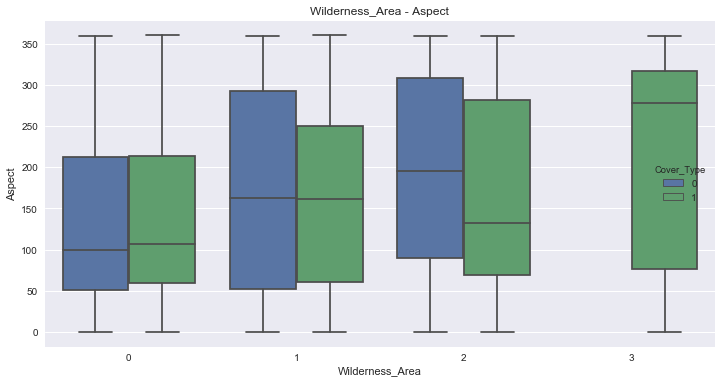

C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\distributions.py:192: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


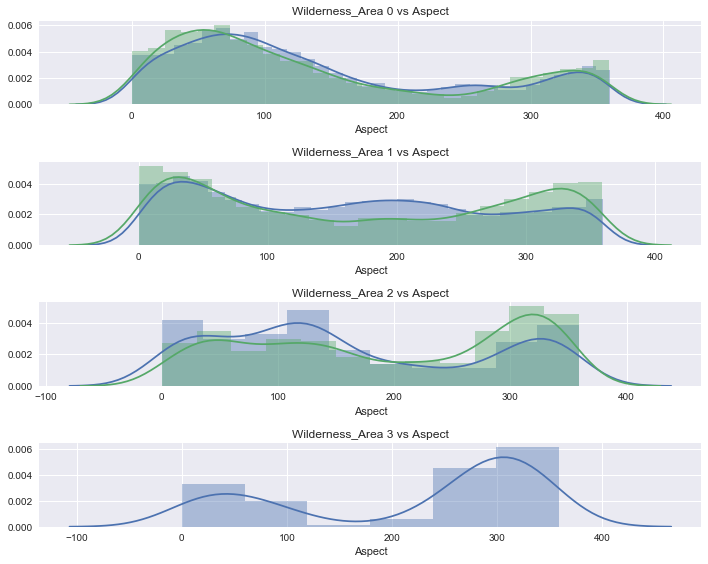

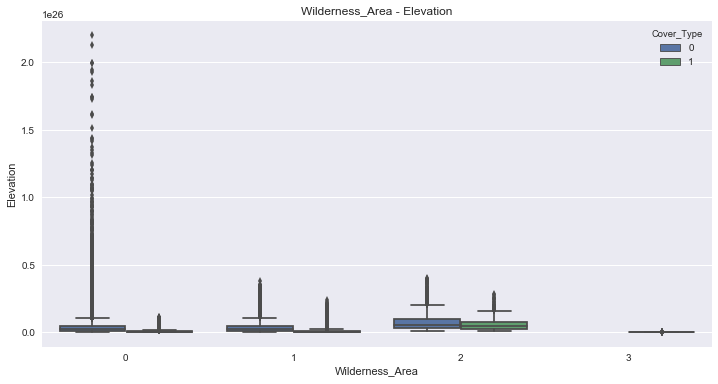

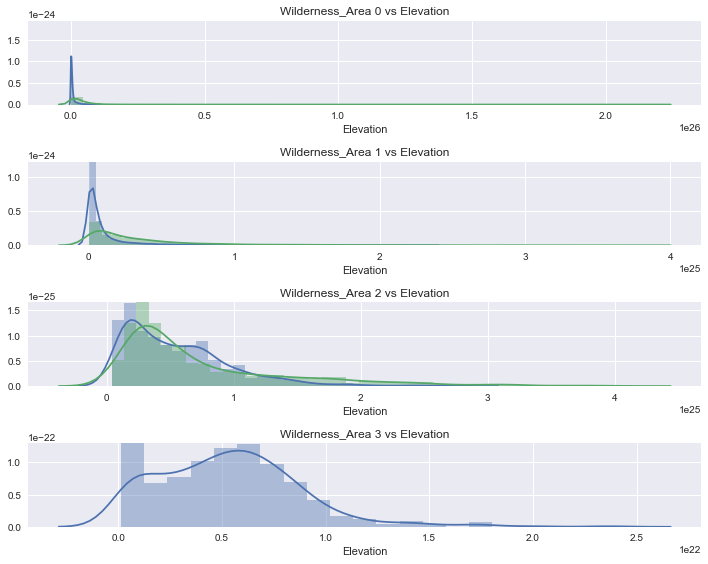

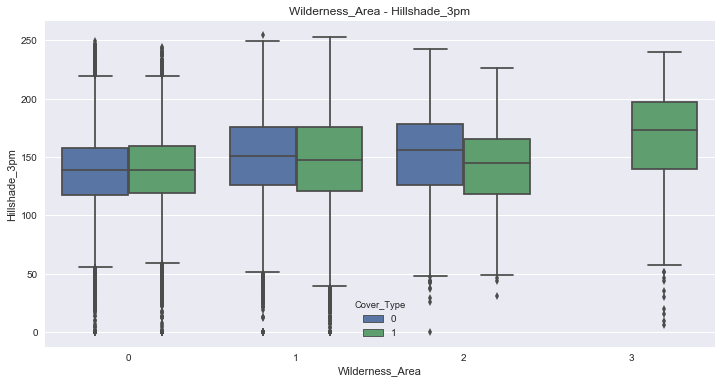

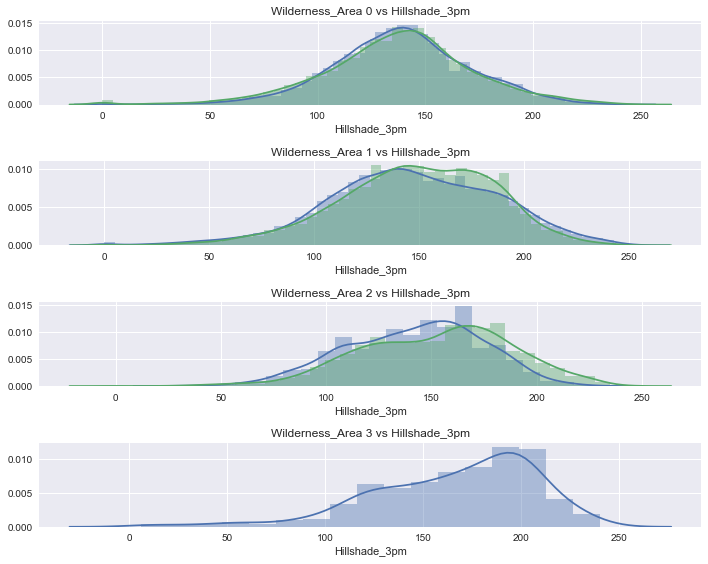

...

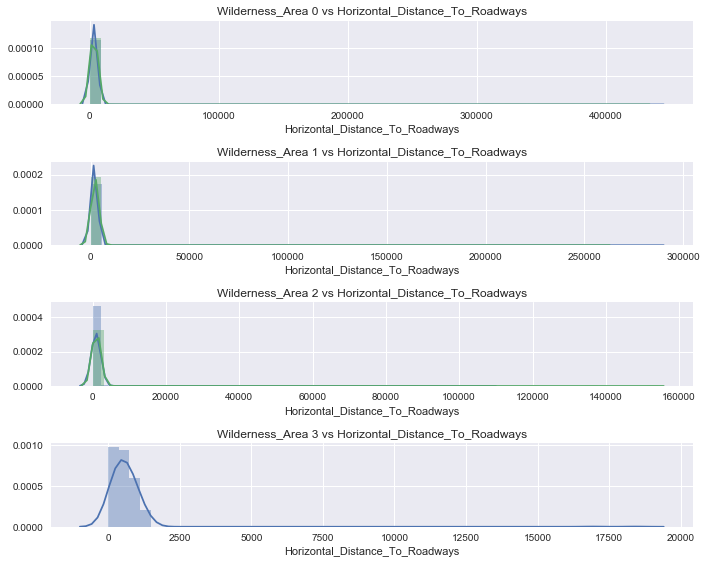

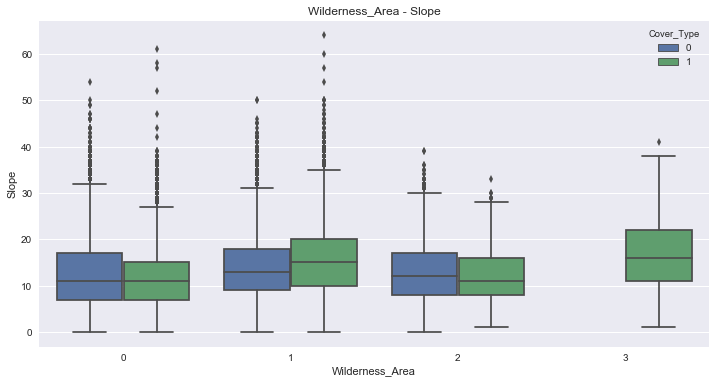

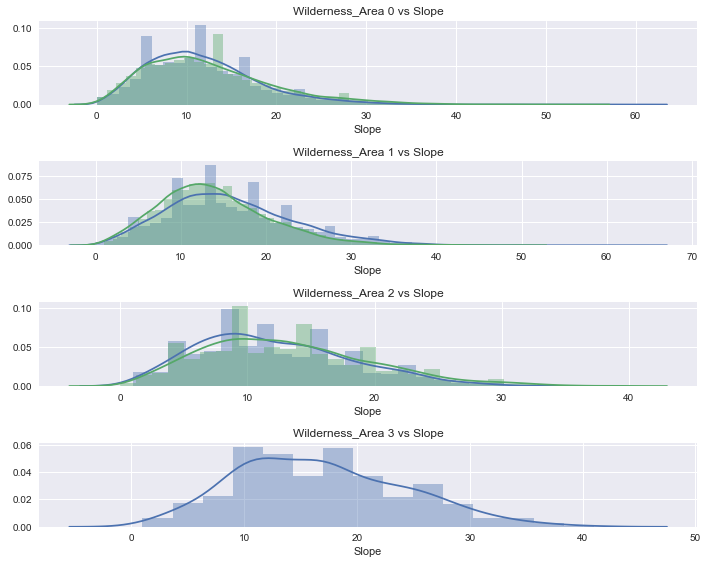

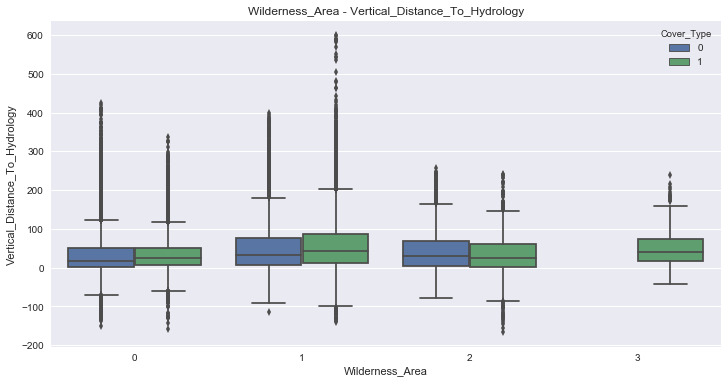

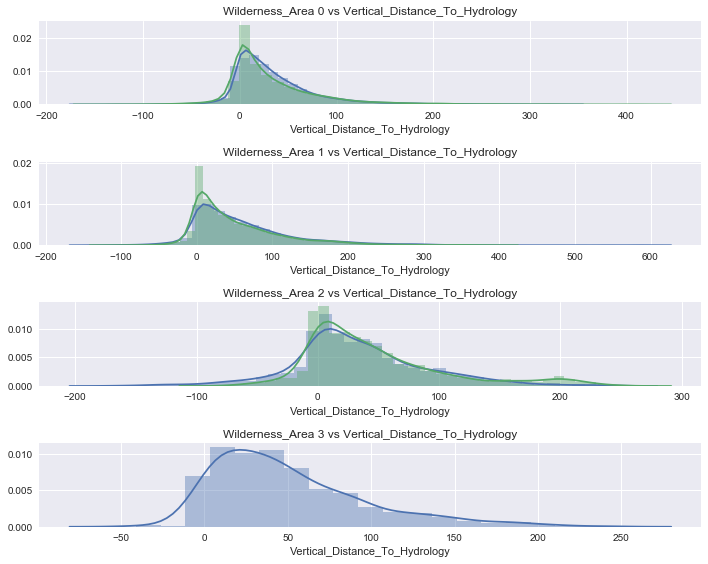

In [55]:
wilderness_area_uniqlist = train['Wilderness_Area'].unique()

for col in numerical_feature:
    plt.figure(figsize=(12,6))
    sns.boxplot(x='Wilderness_Area', y=col, hue='Cover_Type', data=train.dropna())
    plt.title("Wilderness_Area - {}".format(col))
    plt.show()
    
    fig, axes = plt.subplots(nrows=4, figsize=(10,8))
    for index, wild in enumerate(wilderness_area_uniqlist):
        try:
            wild_frame = train.loc[train['Wilderness_Area']==wild].dropna()
            
            axes[index].set_title('Wilderness_Area {} vs {}'.format(wild, col))
            sns.distplot(wild_frame.loc[wild_frame['Cover_Type']==1,col], ax=axes[index])
            sns.distplot(wild_frame.loc[wild_frame['Cover_Type']==0,col], ax=axes[index])         
        except:
            pass
        else:
            del wild_frame
            gc.collect()
    plt.tight_layout()
    plt.show()

In [56]:
soil_frame = train.loc[train['Soil_Type']==1].dropna()   

In [57]:
soil_frame.loc[soil_frame['Cover_Type']==0, 'Aspect'].shape[0]

5647

In [59]:
soil_frame.loc[soil_frame['Cover_Type']==1, 'Aspect'].shape[0]

3350

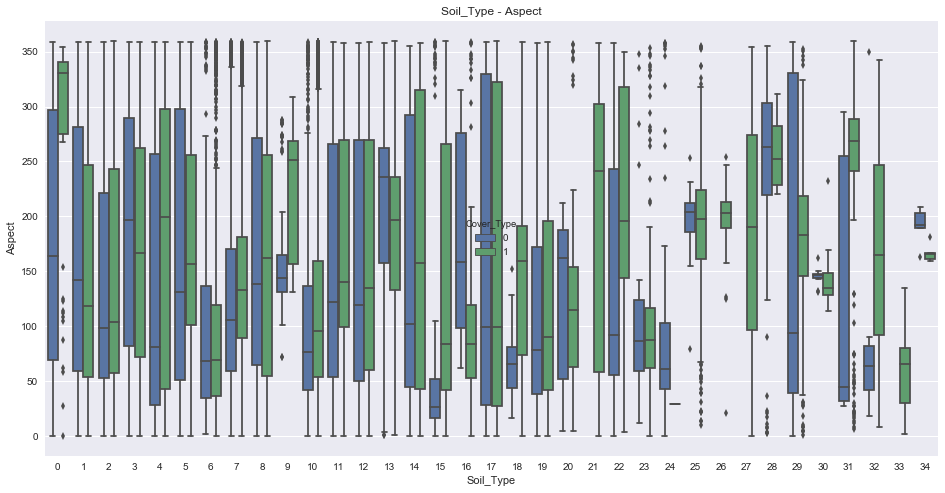

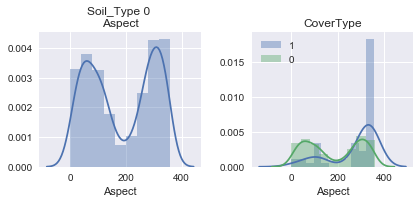

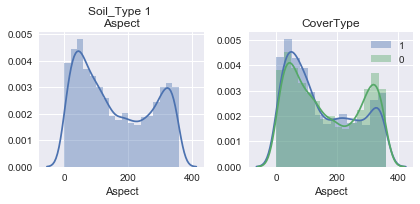

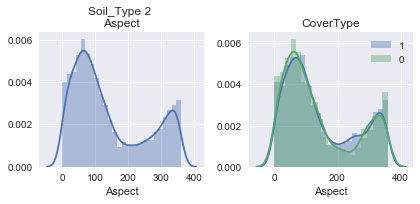

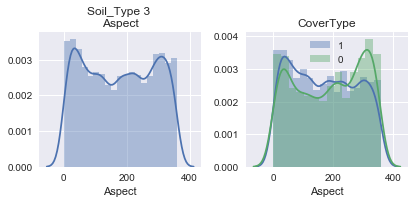

...

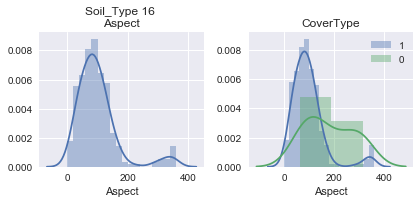

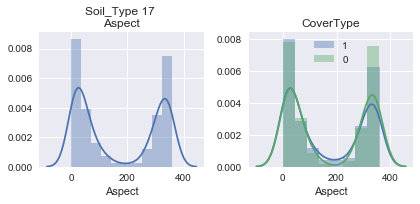

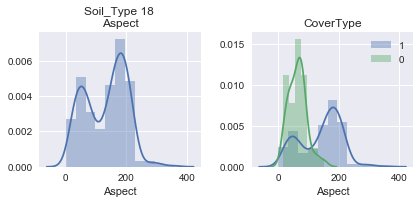

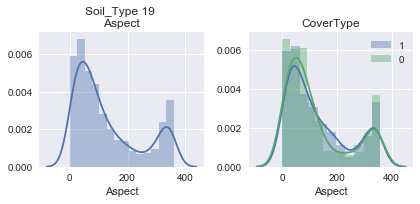

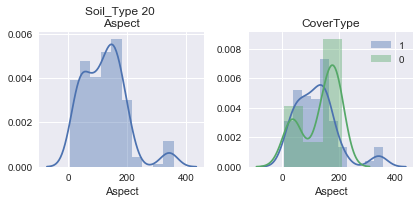

C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\distributions.py:192: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
C:\Program Files\Anaconda3\envs\tensorflow\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


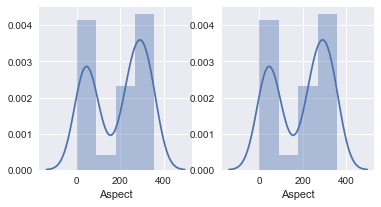

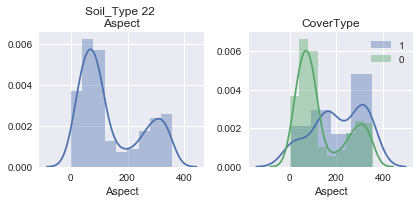

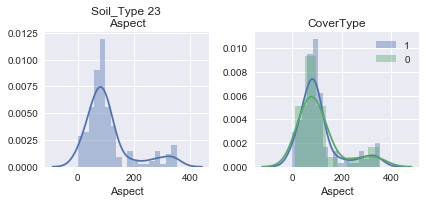

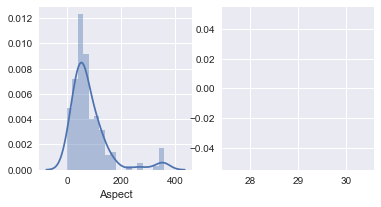

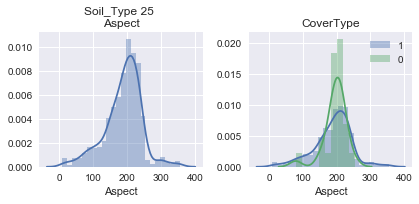

...

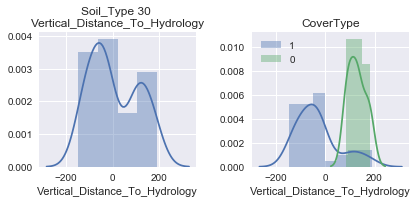

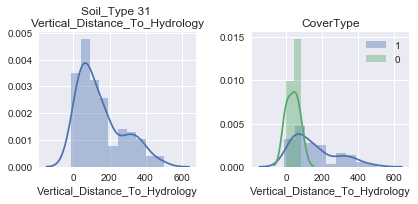

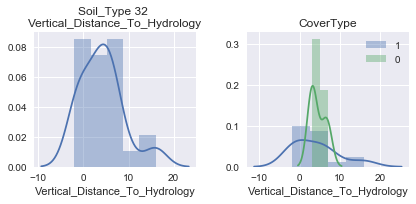

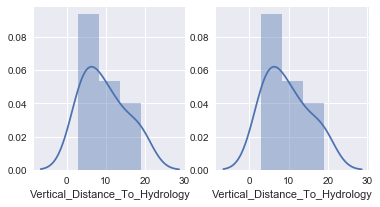

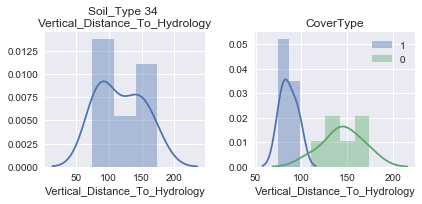

In [60]:
soiltype_uniqlist = train['Soil_Type'].unique()

for col in numerical_feature:
    plt.figure(figsize=(16,8))
    sns.boxplot(x='Soil_Type', y=col, hue='Cover_Type', data=train.dropna())
    plt.title("Soil_Type - {}".format(col))
    plt.show()
    
    soiltype_uniqlist = train['Soil_Type'].unique()
    for index, soil in enumerate(soiltype_uniqlist):
        try:
            fig, axes = plt.subplots(ncols=2, figsize=(6,3))
            soil_frame = train.loc[train['Soil_Type']==soil].dropna()        
            sns.distplot(soil_frame[col], ax=axes[0])  
            sns.distplot(soil_frame.loc[soil_frame['Cover_Type']==1, col], ax=axes[1])  
            sns.distplot(soil_frame.loc[soil_frame['Cover_Type']==0, col], ax=axes[1]) 
            axes[0].set_title('Soil_Type {} \n{}'.format(soil, col))
            axes[1].set_title('CoverType')
            axes[1].legend([1,0])
            plt.tight_layout()
            plt.show()
        except:
            pass
        else: 
            del soil_frame
            gc.collect()